In [1]:
!pip install plotly seaborn

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations
from collections import Counter
import plotly.express as px


In [5]:


df = pd.read_csv('/content/Sales_Analysis (1).csv')
df.head()


,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address
0,176558,USB-C Charging Cable,2,11.95,04/19/19 08:46,"917 1st St, Dallas, TX 75001"
1,NaN,NaN,NaN,NaN,NaN,NaN
2,176559,Bose SoundSport Headphones,1,99.99,04-07-2019 22:30,"682 Chestnut St, Boston, MA 02215"
3,176560,Google Phone,1,600,04-12-2019 14:38,"669 Spruce St, Los Angeles, CA 90001"
4,176560,Wired Headphones,1,11.99,04-12-2019 14:38,"669 Spruce St, Los Angeles, CA 90001"


In [6]:
df.dropna(inplace=True)
df.drop_duplicates(inplace=True)

df['Order ID'] = pd.to_numeric(df['Order ID'], errors='coerce')
df['Quantity Ordered'] = pd.to_numeric(df['Quantity Ordered'], errors='coerce')
df['Price Each'] = pd.to_numeric(df['Price Each'], errors='coerce')
df['Order Date'] = pd.to_datetime(df['Order Date'], errors='coerce')
df.dropna(inplace=True)


<ipython-input-6-9b9cd6af1553>:7: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['Order Date'] = pd.to_datetime(df['Order Date'], errors='coerce')


In [7]:
df['year'] = df['Order Date'].dt.year
df['month'] = df['Order Date'].dt.month
df['day'] = df['Order Date'].dt.day
df['time'] = df['Order Date'].dt.time
df['Order_hour'] = df['Order Date'].dt.hour
df['Order_day'] = df['Order Date'].dt.dayofweek
df['Product_integer'] = df['Price Each'].astype(int)
df['Pincodes'] = df['Purchase Address'].str[-5:]
df['Order ID'] = df['Order ID'].astype(int)

df1 = df['Purchase Address'].str.split(',', n=3, expand=True)
df1.columns = ['Street', 'City', 'Zip']
df = pd.concat([df, df1['City']], axis=1)


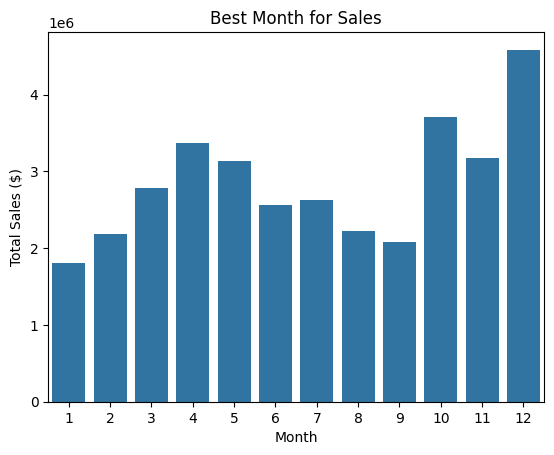

In [10]:
best_month = df.groupby('Order_month')[['Price Each']].sum()

sns.barplot(x=best_month.index, y=best_month['Price Each'])
plt.title("Best Month for Sales")
plt.xlabel("Month")
plt.ylabel("Total Sales ($)")
plt.show()


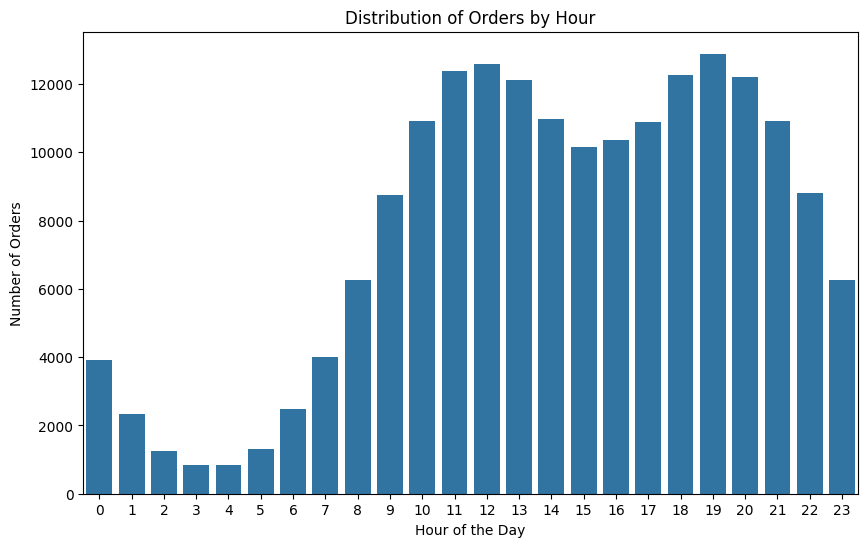

In [11]:
hourly_orders = df.groupby('Order_hour').size()

plt.figure(figsize=(10, 6))
sns.barplot(x=hourly_orders.index, y=hourly_orders.values)
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Orders')
plt.title('Distribution of Orders by Hour')
plt.xticks(range(24))
plt.show()


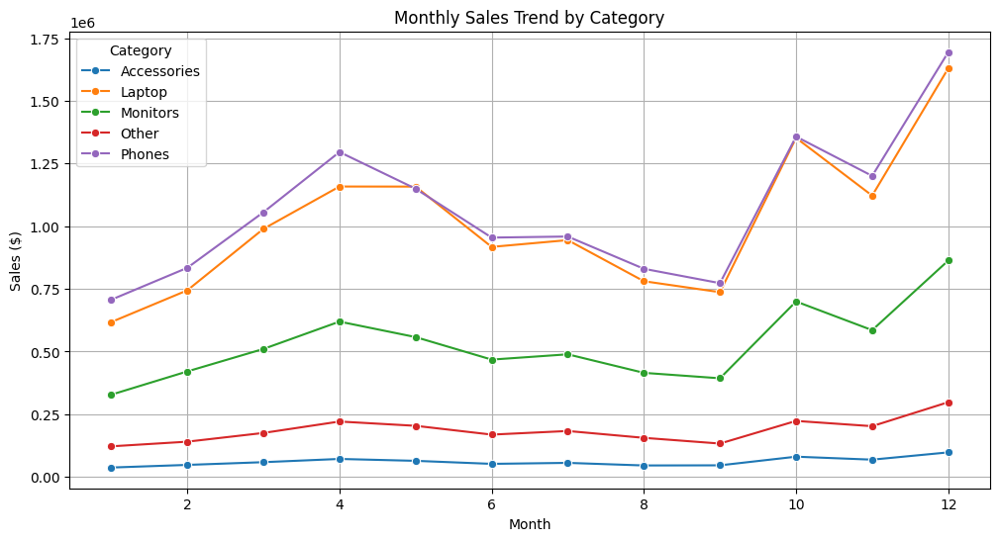

In [12]:
category_month_sales = df.groupby(['Order_month', 'Category'])['Price Each'].sum().reset_index()

plt.figure(figsize=(12, 6))
sns.lineplot(data=category_month_sales, x='Order_month', y='Price Each', hue='Category', marker='o')
plt.title('Monthly Sales Trend by Category')
plt.xlabel('Month')
plt.ylabel('Sales ($)')
plt.grid(True)
plt.show()


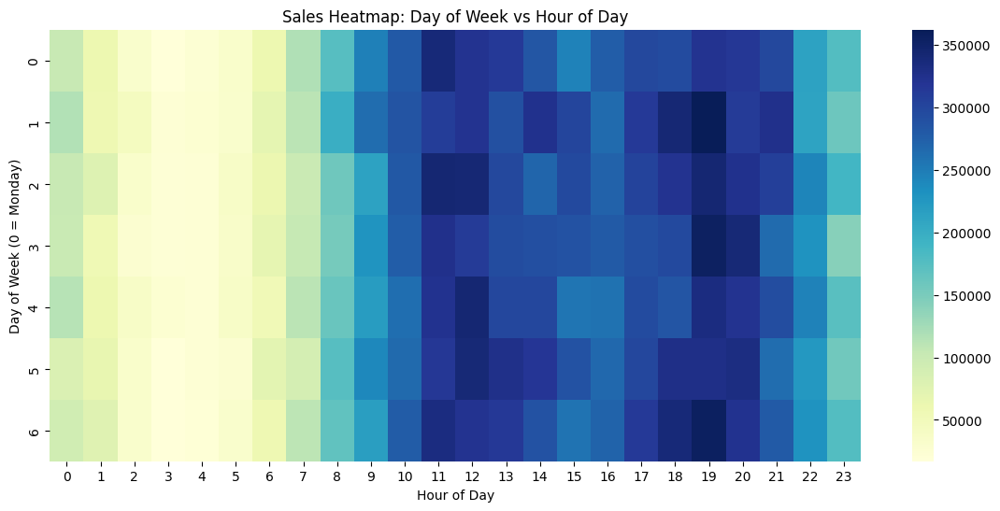

In [13]:
sales_pivot = df.pivot_table(index='Order_day', columns='Order_hour', values='Price Each', aggfunc='sum')

plt.figure(figsize=(14, 6))
sns.heatmap(sales_pivot, cmap='YlGnBu')
plt.title('Sales Heatmap: Day of Week vs Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Day of Week (0 = Monday)')
plt.show()


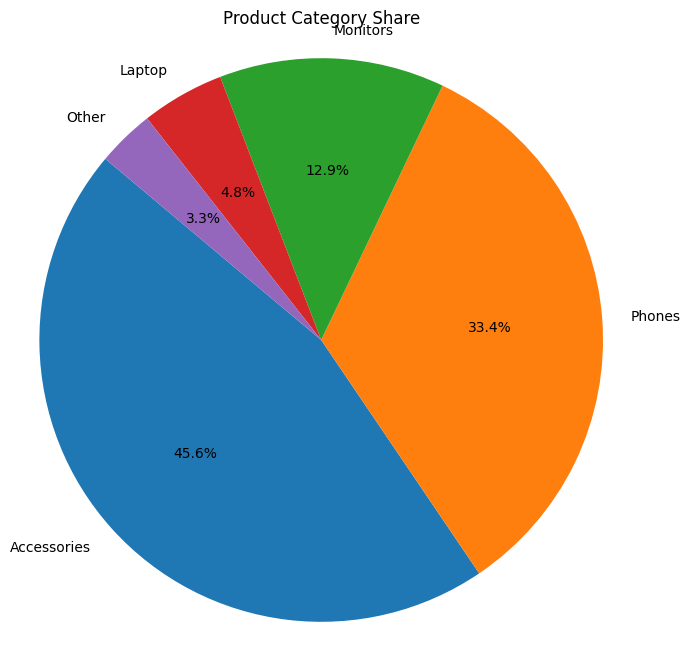

In [14]:
category_counts = df['Category'].value_counts()

plt.figure(figsize=(8, 8))
plt.pie(category_counts, labels=category_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Product Category Share')
plt.axis('equal')
plt.show()


<ipython-input-15-8758cc09e9d9>:11: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(product_sales.index, rotation=90)


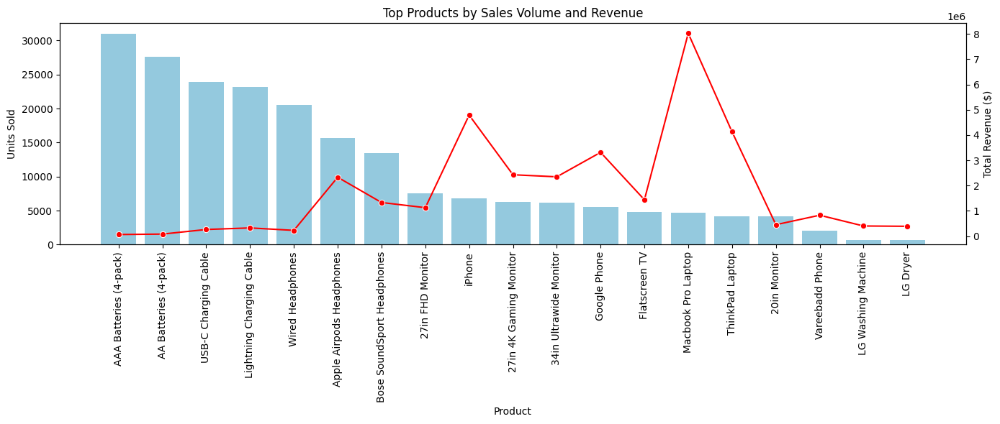

In [15]:
product_sales = df.groupby('Product').agg({'Quantity Ordered': 'sum', 'Price Each': 'sum'}).sort_values(by='Quantity Ordered', ascending=False)

fig, ax1 = plt.subplots(figsize=(14, 6))
sns.barplot(x=product_sales.index, y='Quantity Ordered', data=product_sales, color='skyblue', ax=ax1)
ax2 = ax1.twinx()
sns.lineplot(x=product_sales.index, y='Price Each', data=product_sales, color='red', marker='o', ax=ax2)

ax1.set_ylabel('Units Sold')
ax2.set_ylabel('Total Revenue ($)')
ax1.set_title('Top Products by Sales Volume and Revenue')
ax1.set_xticklabels(product_sales.index, rotation=90)
plt.tight_layout()
plt.show()


<ipython-input-16-27b5c6d824a5>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  order_df['Grouped'] = order_df.groupby('Order ID')['Product'].transform(lambda x: ','.join(x))
<ipython-input-16-27b5c6d824a5>:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=counts, y=labels, palette='magma')


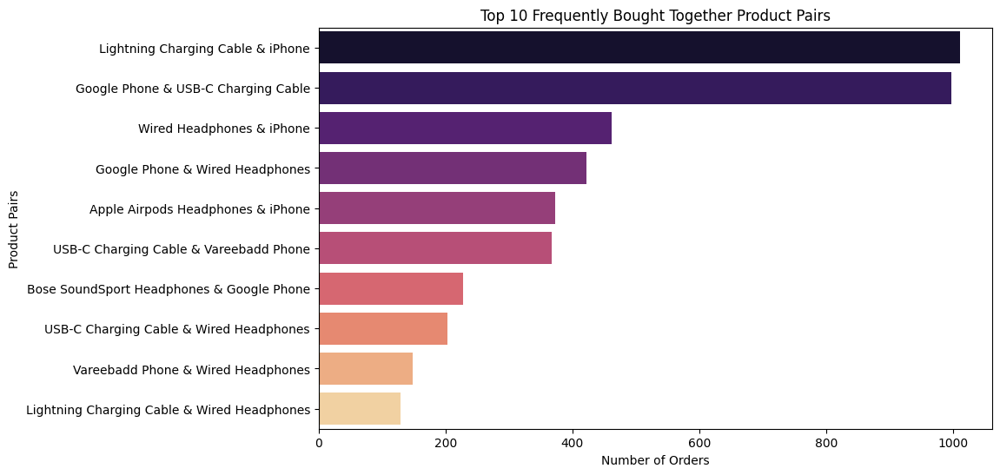

In [16]:
order_df = df[df['Order ID'].duplicated(keep=False)]
order_df['Grouped'] = order_df.groupby('Order ID')['Product'].transform(lambda x: ','.join(x))
grouped = order_df[['Order ID', 'Grouped']].drop_duplicates()

count = Counter()
for items in grouped['Grouped']:
    item_list = items.split(',')
    count.update(Counter(combinations(sorted(item_list), 2)))

most_common_pairs = count.most_common(10)
products, counts = zip(*most_common_pairs)
labels = [f'{a} & {b}' for a, b in products]

plt.figure(figsize=(10, 6))
sns.barplot(x=counts, y=labels, palette='magma')
plt.title('Top 10 Frequently Bought Together Product Pairs')
plt.xlabel('Number of Orders')
plt.ylabel('Product Pairs')
plt.show()


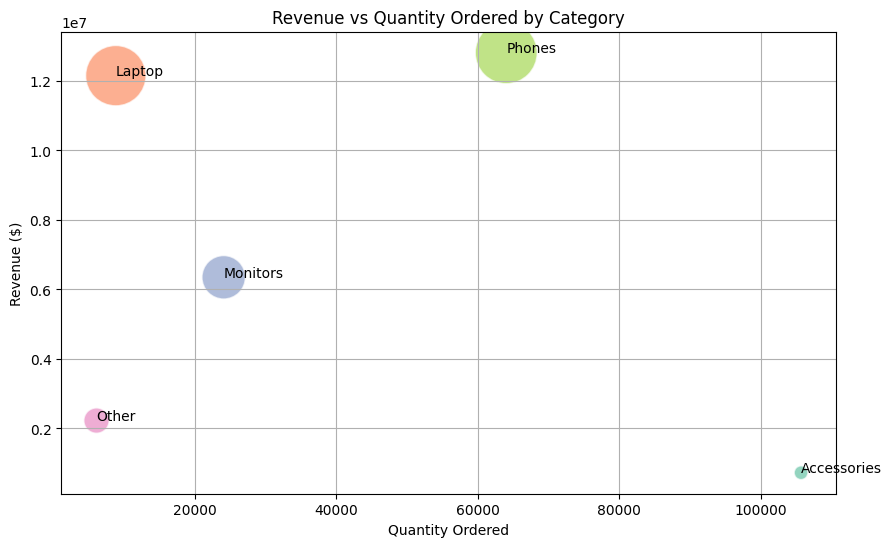

In [17]:
bubble_df = df.groupby('Category').agg({'Quantity Ordered': 'sum', 'Price Each': 'sum'}).reset_index()

plt.figure(figsize=(10, 6))
sns.scatterplot(data=bubble_df, x='Quantity Ordered', y='Price Each', size='Price Each', hue='Category', sizes=(100, 2000), alpha=0.7, palette='Set2', legend=False)
for i in range(len(bubble_df)):
    plt.text(x=bubble_df['Quantity Ordered'][i]+10, y=bubble_df['Price Each'][i], s=bubble_df['Category'][i])
plt.xlabel('Quantity Ordered')
plt.ylabel('Revenue ($)')
plt.title('Revenue vs Quantity Ordered by Category')
plt.grid(True)
plt.show()


In [18]:
fig = px.scatter_3d(df,
                    x='Order_month',
                    y='City',
                    z='Price Each',
                    color='Category',
                    size='Quantity Ordered',
                    hover_name='Product',
                    title='3D Scatter: Sales by City, Month, and Price')

fig.update_layout(scene=dict(
    xaxis_title='Month',
    yaxis_title='City',
    zaxis_title='Price ($)'
))

fig.show()
